## Princpais ferramentas GIS
- Buffer
- Clip
- Merge
- Dissolve
- Intersect e Difference
- Union

In [6]:
import pandas as pd
import geopandas as gpd
import fiona
import contextily as cx
import os

In [11]:
data_est_trem = r"C:\Users\caio.souza\Desktop\pos\mod_8\modulo8\dados\Estacao_Trem_SP.shp"
data_lin_trem = r"C:\Users\caio.souza\Desktop\pos\mod_8\modulo8\dados\Linha_Trem_SP.shp"

In [12]:
data_est_trem = gpd.read_file(data_est_trem)
data_lin_trem = gpd.read_file(data_lin_trem)

In [13]:
data_est_trem.head()

,etr_situac,etr_linha,etr_nome,etr_empres,geometry
0,OPERANDO,DIAMANTE,PARADA AMADOR BUENO,CPTM,POINT (297477.101 7396351.054)
1,OPERANDO,RUBI,JUNDIAÍ,CPTM,POINT (308378.796 7433640.756)
2,OPERANDO,ESMERALDA,PRIMAVERA-INTERLAGOS,CPTM,POINT (327545.649 7375448.035)
3,OPERANDO,ESMERALDA,GRAJAÚ,CPTM,POINT (327027.861 7373920.436)
4,OPERANDO,TURQUESA,PREFEITO CELSO DANIEL-SANTO ANDRÉ,CPTM,POINT (344127.852 7383458.049)


In [14]:
data_est_trem.crs

<Projected CRS: EPSG:31983>
Name: SIRGAS 2000 / UTM zone 23S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Brazil - between 48°W and 42°W, northern and southern hemispheres, onshore and offshore.
- bounds: (-48.0, -33.5, -42.0, 5.13)
Coordinate Operation:
- name: UTM zone 23S
- method: Transverse Mercator
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<Axes: >

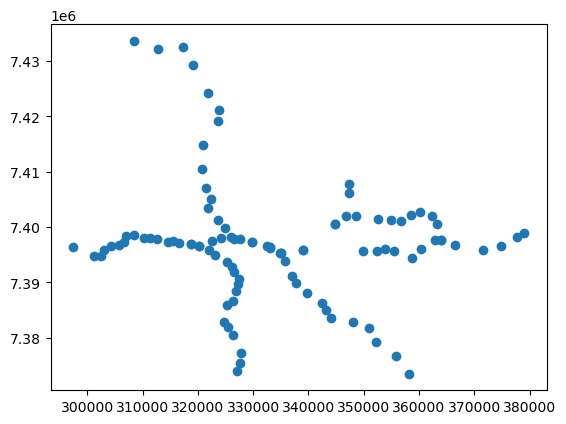

In [15]:
data_est_trem.plot()

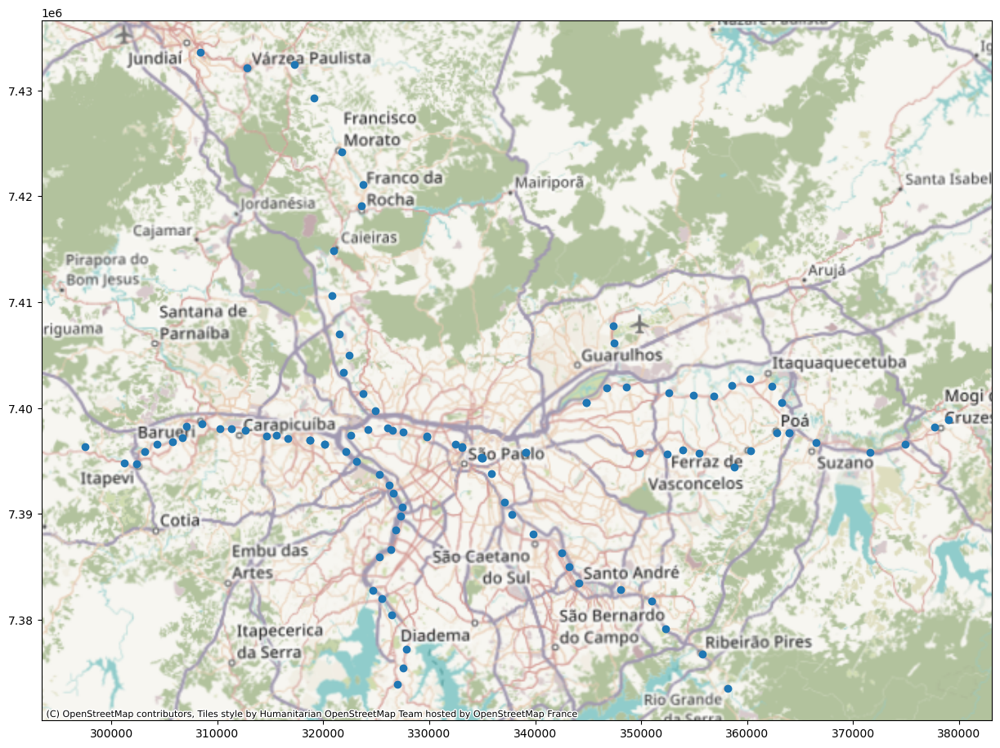

In [16]:
ax = data_est_trem.plot(figsize=(15,15), color='None')
data_est_trem.plot(ax=ax) #passando o "ax" que acabamos de definir
cx.add_basemap(ax, crs=data_est_trem.crs) #biblioteca contextily adicionada ao basemap

# BUFFER

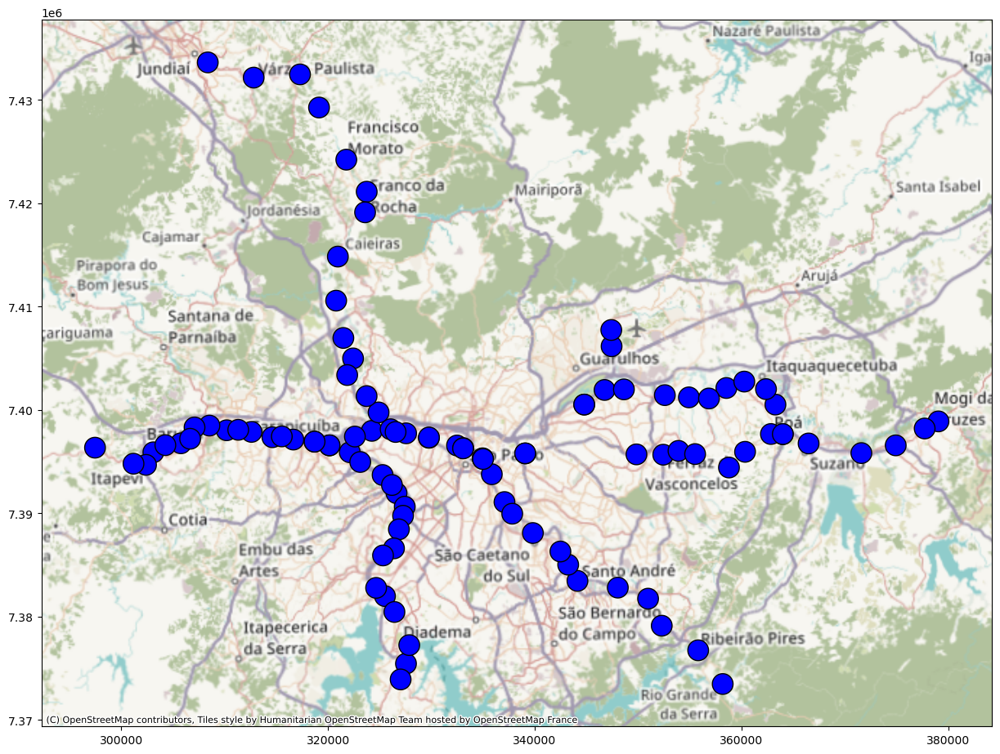

In [20]:
#buffer das estações de trem sp
ax = data_est_trem.plot(figsize=(15,15), color='None')
data_est_trem.buffer(1000).plot(ax=ax, edgecolor='black', color='Blue') #agora adicionamos o .buffer
cx.add_basemap(ax, crs=data_est_trem.crs) 

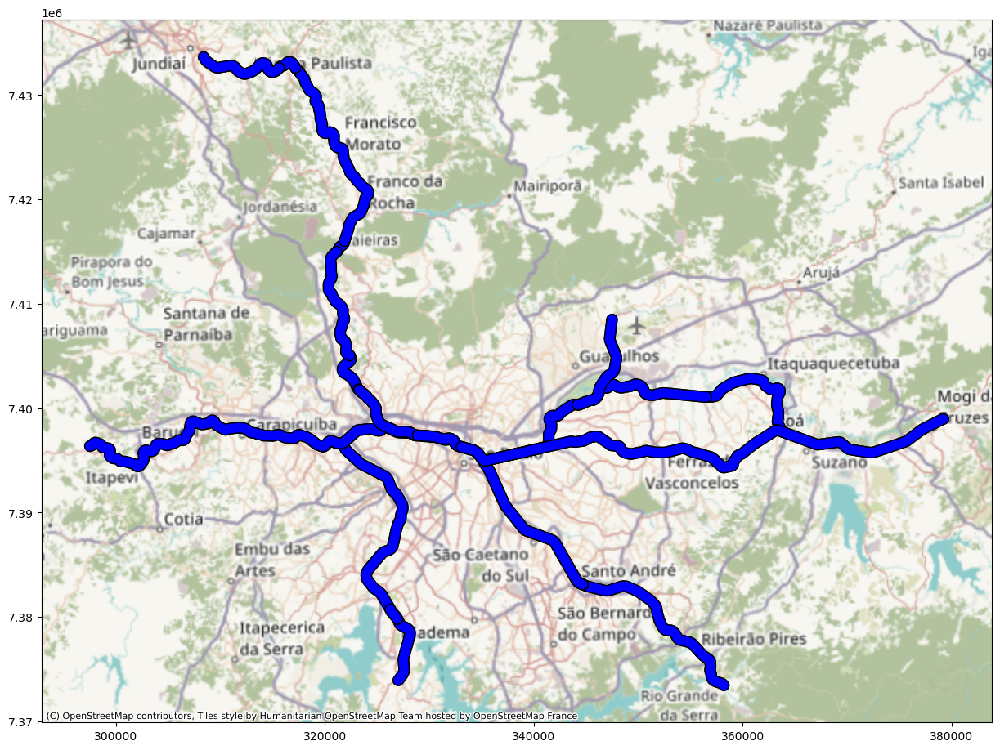

In [21]:
#buffer das linhas de trem sp
ax = data_lin_trem.plot(figsize=(15,15), color='None')
data_lin_trem.buffer(500).plot(ax=ax, edgecolor='black', color='Blue') #agora adicionamos o .buffer
cx.add_basemap(ax, crs=data_lin_trem.crs) 

# Intersecção e Diferença

In [62]:
lin_trem_buff = data_lin_trem.buffer(500)
est_trem_buff = data_est_trem.buffer(1000)

In [63]:
lin_trem_buff.head()

0    POLYGON ((344209.966 7400832.378, 344223.927 7...
1    POLYGON ((344527.493 7400981.663, 344533.839 7...
2    POLYGON ((344387.389 7400907.608, 344391.247 7...
3    POLYGON ((319277.581 7397115.058, 319307.731 7...
4    POLYGON ((319229.336 7397155.049, 319238.743 7...
dtype: geometry

In [64]:
type(lin_trem_buff)

geopandas.geoseries.GeoSeries

In [65]:
#transformando em GeoDataFrame
A = gpd.GeoDataFrame({'geometry': est_trem_buff})
B = gpd.GeoDataFrame({'geometry': lin_trem_buff})

In [66]:
#realizando a intersecção
A_intersect_B = A[A.intersects(B.unary_union)].copy()


C:\Users\caio.souza\AppData\Local\Temp\ipykernel_58340\2364063573.py:2: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  A_intersect_B = A[A.intersects(B.unary_union)].copy()


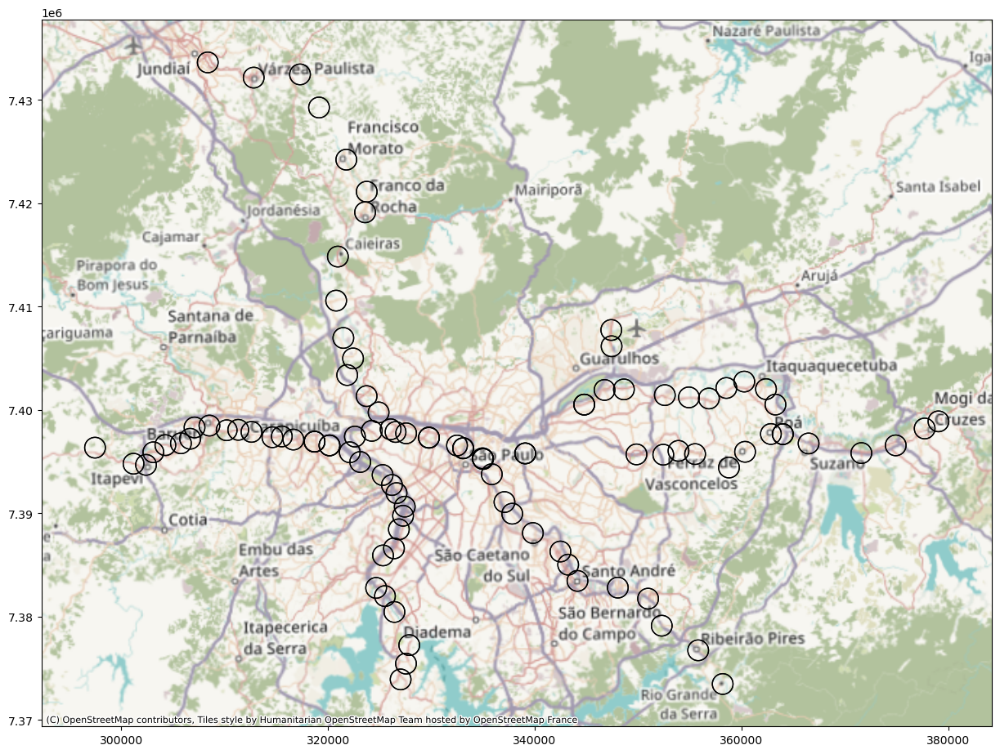

In [67]:
ax = A_intersect_B.plot(figsize=(15,15), color='None')

A_intersect_B.plot(ax=ax, edgecolor='black', color='None')

cx.add_basemap(ax, crs=A_intersect_B.crs)

In [68]:
#realizando diferença
A_diffe_B = A.overlay(B, how='difference')

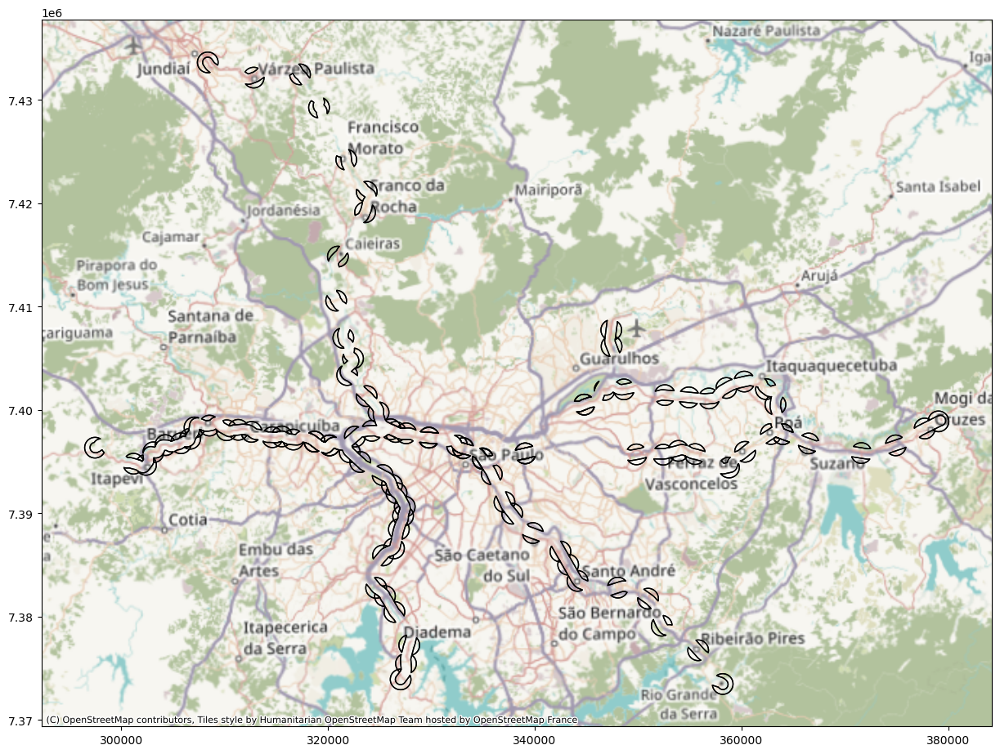

In [69]:
ax = A_diffe_B.plot(figsize=(15,15), color='None')

A_diffe_B.plot(ax=ax, edgecolor='black', color='None')

cx.add_basemap(ax, crs=A_diffe_B.crs)

# Dissolve

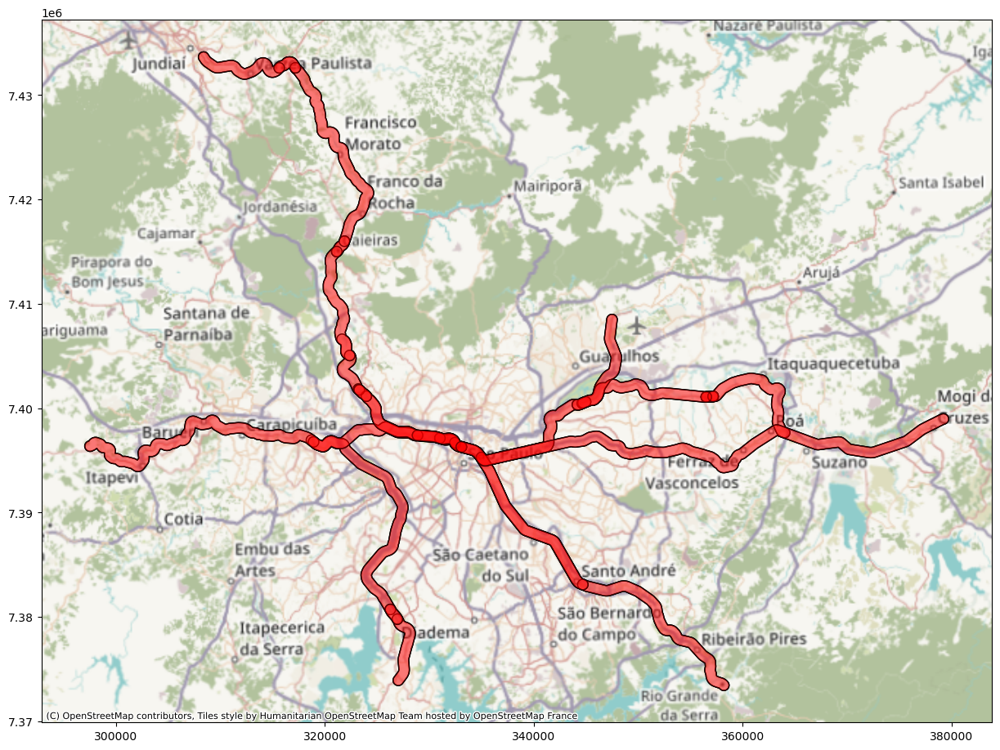

In [70]:
ax = B.plot(figsize=(15,15), color='None')

B.plot(ax=ax, edgecolor='black', color='red', alpha=0.3)

cx.add_basemap(ax, crs=B.crs)

In [71]:
#notamos que alguns pontos n foram "dissolvidos" portanto:
lin_trem_dissolve = B.dissolve()

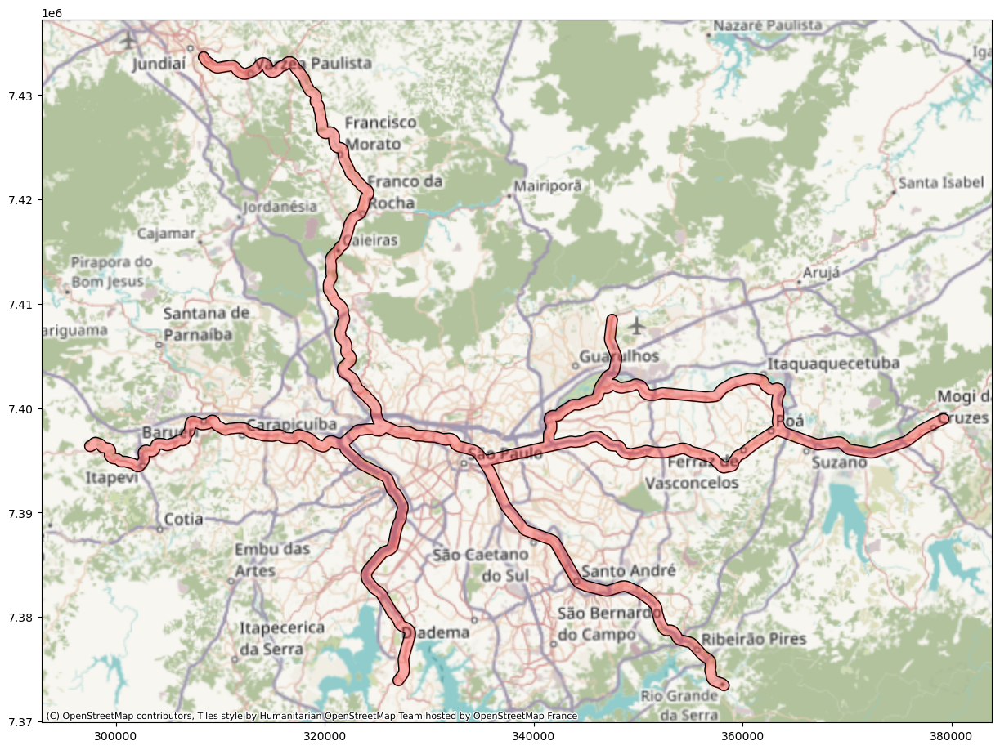

In [72]:
ax = lin_trem_dissolve.plot(figsize=(15,15), color='None')

lin_trem_dissolve.plot(ax=ax, edgecolor='black', color='red', alpha=0.3)

cx.add_basemap(ax, crs=B.crs)
#pontos dissolvidos.

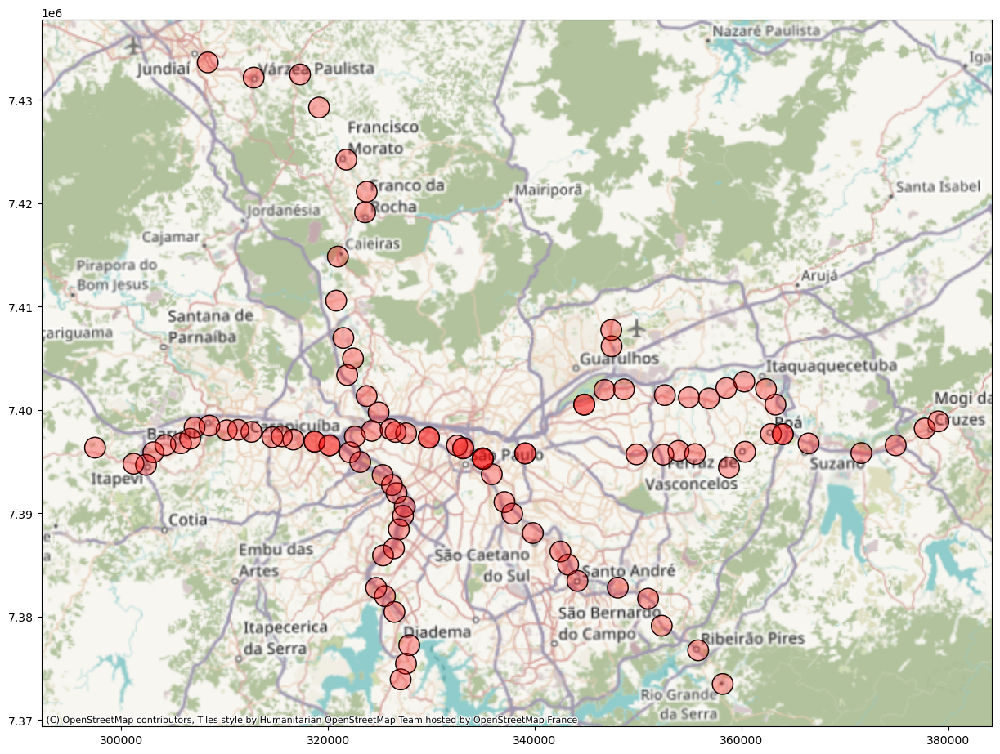

In [73]:
ax = A.plot(figsize=(15,15), color='None')

A.plot(ax=ax, edgecolor='black', color='red', alpha=0.3)

cx.add_basemap(ax, crs=A.crs)

In [74]:
est_trem_dissolve = A.dissolve()

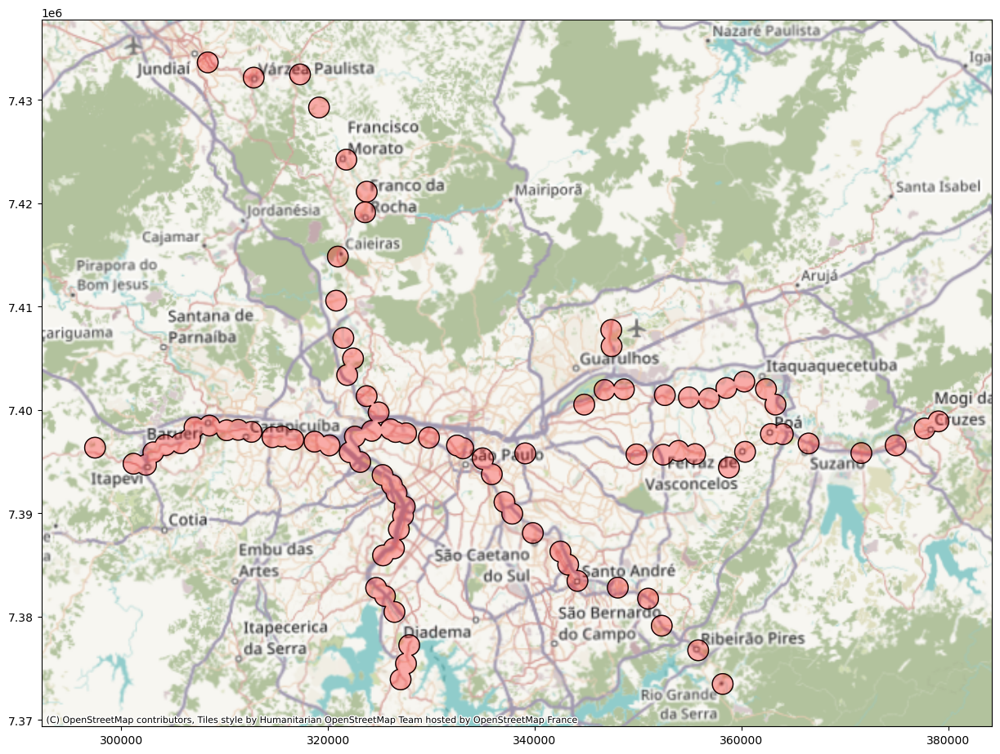

In [75]:
ax = est_trem_dissolve.plot(figsize=(15,15), color='None')

est_trem_dissolve.plot(ax=ax, edgecolor='black', color='red', alpha=0.3)

cx.add_basemap(ax, crs=A.crs)

# Clip (recorte)

In [76]:
trem_clip = lin_trem_dissolve.clip(est_trem_dissolve)

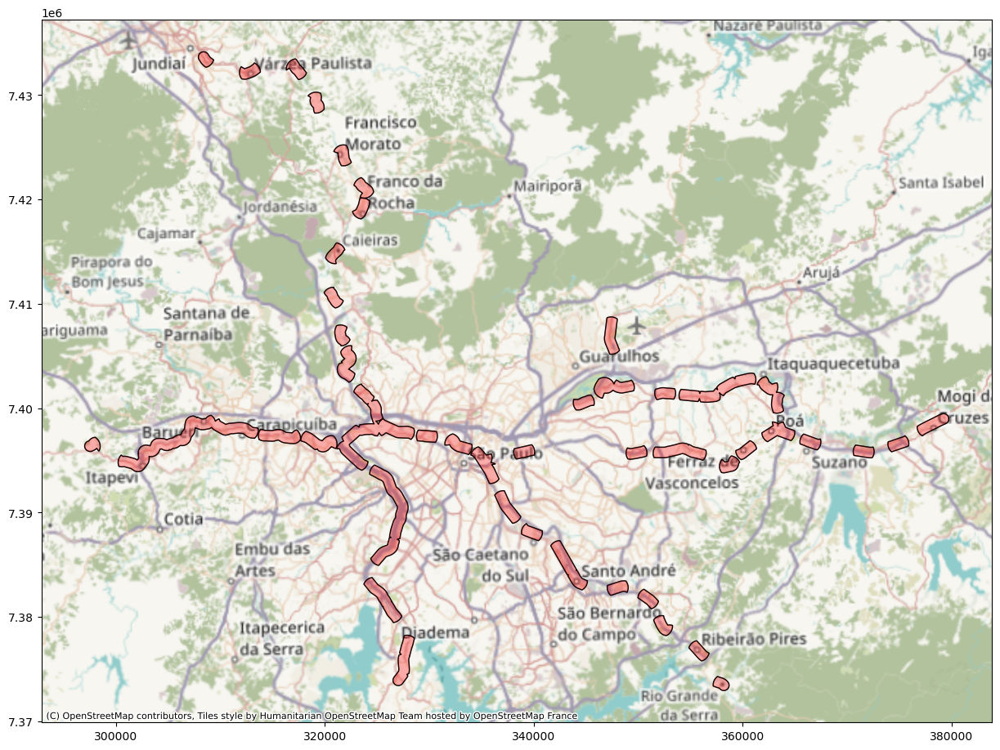

In [78]:
ax = trem_clip.plot(figsize=(15,15), color='None')

trem_clip.plot(ax=ax, edgecolor='black', color='red', alpha=0.3)

cx.add_basemap(ax, crs=A.crs)
#onde houve a intersecção entre est trem e linha fizemos o recorte

# Merge

In [79]:
B.head()

,geometry
0,"POLYGON ((344209.966 7400832.378, 344223.927 7..."
1,"POLYGON ((344527.493 7400981.663, 344533.839 7..."
2,"POLYGON ((344387.389 7400907.608, 344391.247 7..."
3,"POLYGON ((319277.581 7397115.058, 319307.731 7..."
4,"POLYGON ((319229.336 7397155.049, 319238.743 7..."


In [81]:
#eu quero adicionar SP à esta lista
B.shape

(45, 1)

In [82]:
#criaremos uma lista vazia
regiao = []
for i in range(len(B)):
    regiao.append('SP')

print(regiao)

['SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP']


In [83]:
len(regiao)

45

In [84]:
regiao_df = pd.DataFrame({'Região': regiao}) #fazendo a coluna de "Região" e testando para ver se deu certo

In [85]:
regiao_df.head()

,Região
0,SP
1,SP
2,SP
3,SP
4,SP


In [86]:
regiao_df.shape

(45, 1)

In [88]:
#podemos utilizar left_on e right_on
lin_reg_merge = B.merge(regiao_df, left_index=True, right_index=True) #left_index=True, right_indext=True parametros usados para n dar erro

In [89]:
lin_reg_merge.head()

,geometry,Região
0,"POLYGON ((344209.966 7400832.378, 344223.927 7...",SP
1,"POLYGON ((344527.493 7400981.663, 344533.839 7...",SP
2,"POLYGON ((344387.389 7400907.608, 344391.247 7...",SP
3,"POLYGON ((319277.581 7397115.058, 319307.731 7...",SP
4,"POLYGON ((319229.336 7397155.049, 319238.743 7...",SP
